## Machine Learning



"Machine Learning" (Aprendizado de Máquina) é uma subárea da Inteligência Artificial (IA) que desenvolve algoritmos capazes de aprender padrões a partir de dados, sem serem explicitamente programados para cada tarefa específica. Em vez de seguir instruções rígidas, os modelos de ML analisam dados históricos e fazem previsões ou decisões com base nesses dados.

- Outras definições:
  - Ciência (e a arte) da programação de computadores de modo que eles possam aprender com os dados;
  - Campo de estudo que possibilita aos computadores aprender sem explicitamente programá-los ( Arthr Samuel, 1959);
  - Alega-se que um programa de computador aprende pela experiência E em relação a algum tipo de tarefa T e alguma medida de desempenho P se ao seu desempenho em T, conforme medido por P, melhora com a experiência E. (Tom Mitchell, 1997)


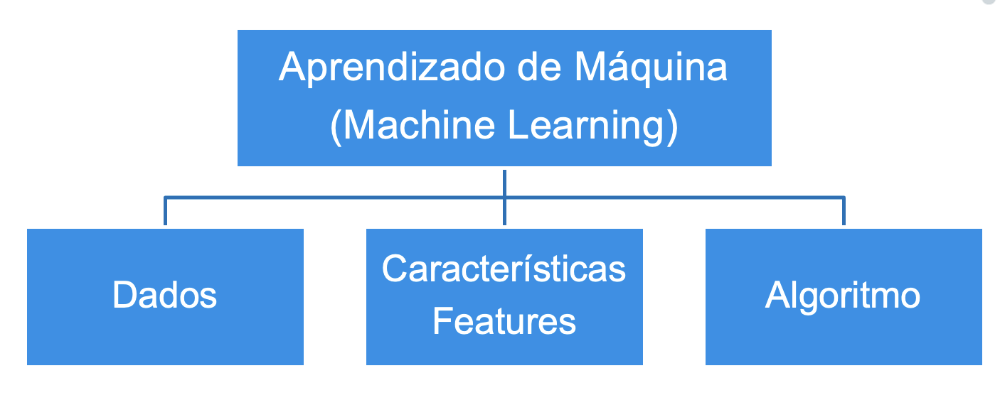

- https://vas3k.com/blog/machine_learning/


In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

### Aprendizado Supervisionado
Neste tipo, o modelo é treinado com um conjunto de dados rotulado, ou seja, cada entrada tem uma saída conhecida. O objetivo é aprender a relação entre entradas (features) e saídas (rótulos) para prever os rótulos de novos dados.

Exemplos:
- Regressão
- Classificação

#### Regressão

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("lakshmi25npathi/bike-sharing-dataset")

print("Path to dataset files:", path)

100%|██████████| 286k/286k [00:00<00:00, 621kB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/lakshmi25npathi/bike-sharing-dataset/versions/1


In [3]:
path

'/root/.cache/kagglehub/datasets/lakshmi25npathi/bike-sharing-dataset/versions/1'

In [5]:
!ls -lh $path

total 1.2M
-rw-r--r-- 1 root root  57K Apr 23 22:20 day.csv
-rw-r--r-- 1 root root 1.2M Apr 23 22:20 hour.csv
-rw-r--r-- 1 root root 5.5K Apr 23 22:20 Readme.txt


In [6]:
bike_df = pd.read_csv(f"{path}/day.csv")

In [7]:
bike_df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [10]:
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [11]:
features = bike_df.columns[4:]
features

Index(['mnth', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp',
       'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt'],
      dtype='object')

In [12]:
bike_df = bike_df[features]
bike_df.head()

,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


### Analise exploratoria de dados

In [13]:
bike_df.describe()

,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,6.519836,0.028728,2.997264,0.683995,1.395349,0.495385,0.474354,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,3.451913,0.167155,2.004787,0.465233,0.544894,0.183051,0.162961,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,0.000000,0.000000,0.000000,1.000000,0.059130,0.079070,0.000000,0.022392,2.000000,20.000000,22.000000
25%,4.000000,0.000000,1.000000,0.000000,1.000000,0.337083,0.337842,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,7.000000,0.000000,3.000000,1.000000,1.000000,0.498333,0.486733,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,10.000000,0.000000,5.000000,1.000000,2.000000,0.655417,0.608602,0.730209,0.233214,1096.000000,4776.500000,5956.000000
max,12.000000,1.000000,6.000000,1.000000,3.000000,0.861667,0.840896,0.972500,0.507463,3410.000000,6946.000000,8714.000000


In [14]:
!pip install -U ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 71.9 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=544eafa58a82afb9abdfd34f46def9061da9beda98dc16729eda810271f65240
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [15]:
from ydata_profiling import ProfileReport

In [16]:
profile = ProfileReport(bike_df, title="Profiling Report for Bike Sharing Dataset")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 12/12 [00:00<00:00, 69.59it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
bike_df.head()

,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [20]:
X = bike_df.drop("cnt", axis=1) # variáveis explicativas
y = bike_df["cnt"] # variavel alvo

In [21]:
X.head(2)

,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered
0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654
1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670


In [22]:
y.head(2)

,cnt
0,985
1,801


In [23]:
from sklearn.model_selection import train_test_split

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [25]:
from sklearn.linear_model import LinearRegression

In [26]:
lr_model = LinearRegression()

In [27]:
lr_model.fit(X_train, y_train) ##treinado minha regressão

LinearRegression()

In [28]:
## Avaliacao do conjunto de teste

y_pred = lr_model.predict(X_test)
y_pred

array([6606., 1550., 3747., 6041., 7538., 7264., 1605., 2209., 7499.,
       5743., 1796., 3068., 4891., 5260., 2133., 2471., 2046., 8156.,
       5362., 2298., 7697., 5463., 5409., 1872., 1807., 5130., 2121.,
       7436., 3830., 5557., 2743., 3644., 6196., 7494., 5918., 3372.,
       7582., 6053., 2566., 1263., 3944., 3956., 7580., 4906., 6966.,
        705., 4458., 5298., 6043., 4996., 3351., 2431., 1011., 4475.,
       4725., 4727., 2395., 3351., 4788., 7175., 6153., 7442., 1471.,
       7865., 6530., 6211., 7403., 4302., 2077., 7333., 3117., 1635.,
       3811., 4595., 4363., 2034., 5686., 4748., 1416., 4401., 2114.,
       2028., 5668.,   22., 3940., 4118., 5423., 1495., 3620., 3403.,
       1501., 7040., 5992., 4990., 3095., 2832., 4713., 2368., 3409.,
       4991., 7713., 3785., 6664., 2496., 2077., 5267., 1162., 2739.,
       6861., 1360., 4602., 7282., 3570., 8167., 6230., 4511., 1461.,
       3272., 5923., 2177., 6398., 1817., 3239., 1349., 3867., 5146.,
       4541., 3368.,

In [29]:
from sklearn.metrics import mean_squared_error

In [30]:
mean_squared_error(y_test, y_pred)

4.3331406066625464e-24

In [54]:
### Classificação "binaria"

#problema: Titanic

titanic_df = sns.load_dataset("titanic")
titanic_df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [55]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   survived     891 non-null    int64   
 1   pclass       891 non-null    int64   
 2   sex          891 non-null    object  
 3   age          714 non-null    float64 
 4   sibsp        891 non-null    int64   
 5   parch        891 non-null    int64   
 6   fare         891 non-null    float64 
 7   embarked     889 non-null    object  
 8   class        891 non-null    category
 9   who          891 non-null    object  
 10  adult_male   891 non-null    bool    
 11  deck         203 non-null    category
 12  embark_town  889 non-null    object  
 13  alive        891 non-null    object  
 14  alone        891 non-null    bool    
dtypes: bool(2), category(2), float64(2), int64(4), object(5)
memory usage: 80.7+ KB


In [56]:
titanic_df.drop('age', axis=1, inplace=True)
titanic_df.drop('deck', axis=1, inplace=True)
titanic_df.drop('embarked', axis=1, inplace=True)
titanic_df.drop('embark_town', axis=1, inplace=True)
titanic_df.drop('alive', axis=1, inplace=True)
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   survived    891 non-null    int64   
 1   pclass      891 non-null    int64   
 2   sex         891 non-null    object  
 3   sibsp       891 non-null    int64   
 4   parch       891 non-null    int64   
 5   fare        891 non-null    float64 
 6   class       891 non-null    category
 7   who         891 non-null    object  
 8   adult_male  891 non-null    bool    
 9   alone       891 non-null    bool    
dtypes: bool(2), category(1), float64(1), int64(4), object(2)
memory usage: 51.6+ KB


In [57]:
titanic_df.head()

,survived,pclass,sex,sibsp,parch,fare,class,who,adult_male,alone
0,0,3,male,1,0,7.2500,Third,man,True,False
1,1,1,female,1,0,71.2833,First,woman,False,False
2,1,3,female,0,0,7.9250,Third,woman,False,True
3,1,1,female,1,0,53.1000,First,woman,False,False
4,0,3,male,0,0,8.0500,Third,man,True,True


In [58]:
##Transforma os dados categoricos em dados numericos
from sklearn.preprocessing import LabelEncoder

In [59]:
titanic_df['sex'].unique()

array(['male', 'female'], dtype=object)

In [60]:
le = LabelEncoder()
pd.Series(le.fit_transform(titanic_df['sex'])).unique()

array([1, 0])

In [61]:
le.classes_

array(['female', 'male'], dtype=object)

In [62]:
##Transformacao 1:
titanic_df['sex'] = le.fit_transform(titanic_df['sex'])

In [63]:
titanic_df['sex'].unique()

array([1, 0])

In [64]:
categorical_variables = ['class', 'who', 'adult_male', 'alone']

for varibale in categorical_variables:
    titanic_df[varibale] = le.fit_transform(titanic_df[varibale])

In [65]:
titanic_df.head(2)

,survived,pclass,sex,sibsp,parch,fare,class,who,adult_male,alone
0,0,3,1,1,0,7.2500,2,1,1,0
1,1,1,0,1,0,71.2833,0,2,0,0


In [66]:
## Transformacao 2: Padronizacao
from sklearn.preprocessing import StandardScaler

In [67]:
scaler = StandardScaler()

In [70]:
titanic_df['fare'] = scaler.fit_transform(titanic_df[['fare']])

In [72]:
titanic_df.head(2)

,survived,pclass,sex,sibsp,parch,fare,class,who,adult_male,alone
0,0,3,1,1,0,-0.502445,2,1,1,0
1,1,1,0,1,0,0.786845,0,2,0,0


In [79]:
from sklearn import tree

In [80]:
##definir o conjunto de treino e teste
X = titanic_df.drop('survived', axis=1) ## variaveis explicativas
y = titanic_df['survived'] # variavel algo

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [82]:
clf = tree.DecisionTreeClassifier()

In [83]:
clf.fit(X_train, y_train)

DecisionTreeClassifier()

In [84]:
y_pred = clf.predict(X_test)

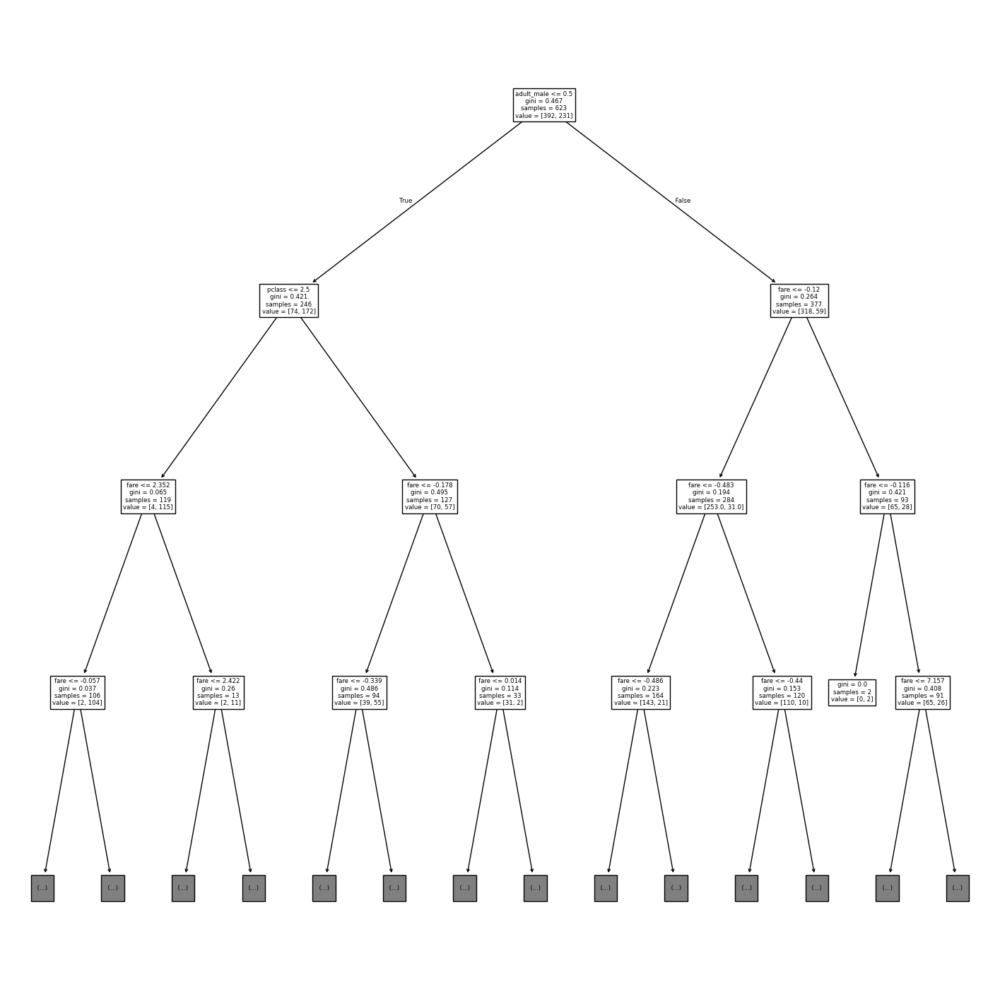

In [90]:
f, ax = plt.subplots(figsize=(18, 18))
tree.plot_tree(clf, max_depth=3, feature_names= X.columns, ax=ax)
plt.show()

In [96]:
from sklearn import metrics

In [97]:
print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      0.89      0.85       157
           1       0.81      0.71      0.76       111

    accuracy                           0.81       268
   macro avg       0.81      0.80      0.80       268
weighted avg       0.81      0.81      0.81       268



In [103]:
cm = metrics.confusion_matrix(y_test, y_pred, labels=clf.classes_)
cm

array([[139,  18],
       [ 32,  79]])

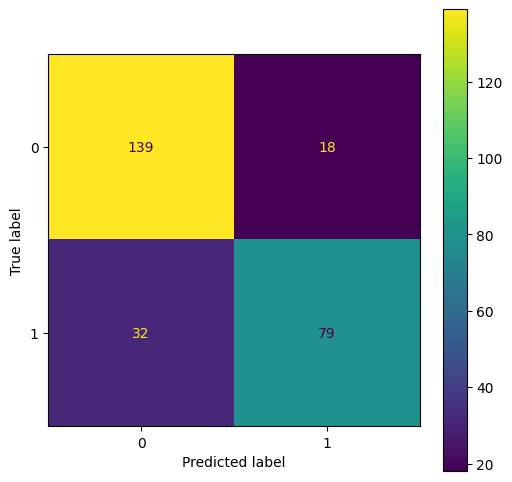

In [104]:
f, ax = plt.subplots(figsize=(6, 6))
metrics.ConfusionMatrixDisplay(cm).plot(ax=ax)
plt.show()

### Aprendizado Não Supervisionado
Neste tipo, os dados não possuem rótulos. O modelo tenta encontrar estruturas, padrões ou agrupamentos nos dados por conta própria.

Exemplos:
- Clusterização
- Redução de dimensionalidade


### Clusterizacao

In [106]:
from sklearn.datasets import load_iris

In [107]:
iris = load_iris()
iris

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [109]:
iris_df = pd.DataFrame(iris.data, columns=iris.feature_names)
iris_df['target'] = iris.target
iris_df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


In [110]:
from sklearn.cluster import KMeans

In [111]:
kmeans = KMeans(n_clusters=3)

In [113]:
kmeans.fit(iris_df.drop('target', axis=1))

KMeans(n_clusters=3)

In [115]:
iris_df['cluster'] = kmeans.labels_
iris_df.head(2)

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target,cluster
0,5.1,3.5,1.4,0.2,0,0
1,4.9,3.0,1.4,0.2,0,0


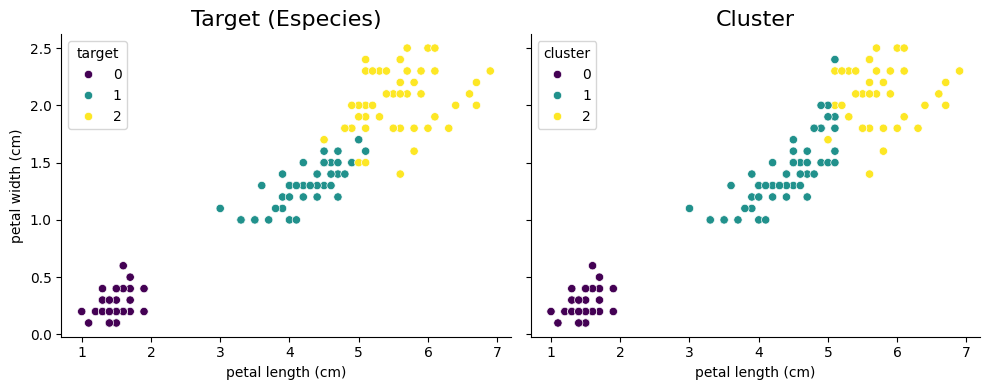

In [124]:
f, ax = plt.subplots(1, 2, sharey=True, figsize=(10, 4))

sns.scatterplot(data=iris_df, x='petal length (cm)', y='petal width (cm)', palette='viridis', hue='target', ax=ax[0])
sns.scatterplot(data=iris_df, x='petal length (cm)', y='petal width (cm)', palette='viridis', hue='cluster', ax=ax[1])

ax[0].set_title('Target (Especies)', fontsize=16)
ax[1].set_title('Cluster', fontsize=16)

sns.despine()
plt.tight_layout()
plt.show()